In [1]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

In [2]:
df = pd.read_csv('/content/drive/MyDrive/archive (1)/Training.csv')
df.drop('Unnamed: 133', axis=1, inplace=True)

In [3]:
df

,itching,skin_rash,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,...,blackheads,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze,prognosis
0,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
1,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
2,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
3,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
4,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4915,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,(vertigo) Paroymsal Positional Vertigo
4916,0,1,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,Acne
4917,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Urinary tract infection
4918,0,1,0,0,0,0,1,0,0,0,...,0,0,1,1,1,1,0,0,0,Psoriasis


In [4]:
print(df.describe())
print('---------------------------------------------------------------')
print(df.info())
print('---------------------------------------------------------------')
print(df.columns)
print('---------------------------------------------------------------')

           itching    skin_rash  nodal_skin_eruptions  continuous_sneezing  \
count  4920.000000  4920.000000           4920.000000          4920.000000   
mean      0.137805     0.159756              0.021951             0.045122   
std       0.344730     0.366417              0.146539             0.207593   
min       0.000000     0.000000              0.000000             0.000000   
25%       0.000000     0.000000              0.000000             0.000000   
50%       0.000000     0.000000              0.000000             0.000000   
75%       0.000000     0.000000              0.000000             0.000000   
max       1.000000     1.000000              1.000000             1.000000   

         shivering       chills   joint_pain  stomach_pain      acidity  \
count  4920.000000  4920.000000  4920.000000   4920.000000  4920.000000   
mean      0.021951     0.162195     0.139024      0.045122     0.045122   
std       0.146539     0.368667     0.346007      0.207593     0.207593 

In [5]:
df.isnull().sum()

itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
prognosis               0
Length: 133, dtype: int64

In [6]:
df['prognosis'].value_counts()

Fungal infection                           120
Hepatitis C                                120
Hepatitis E                                120
Alcoholic hepatitis                        120
Tuberculosis                               120
Common Cold                                120
Pneumonia                                  120
Dimorphic hemmorhoids(piles)               120
Heart attack                               120
Varicose veins                             120
Hypothyroidism                             120
Hyperthyroidism                            120
Hypoglycemia                               120
Osteoarthristis                            120
Arthritis                                  120
(vertigo) Paroymsal  Positional Vertigo    120
Acne                                       120
Urinary tract infection                    120
Psoriasis                                  120
Hepatitis D                                120
Hepatitis B                                120
Allergy      

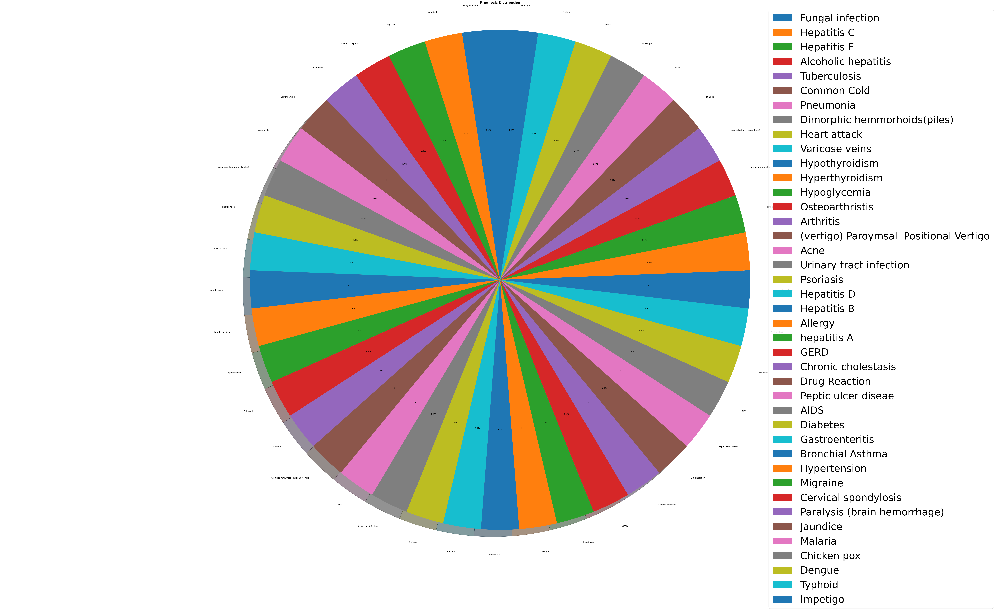

In [7]:
import matplotlib.pyplot as plt
plt.figure(figsize=(90, 50))

category_counts = df['prognosis'].value_counts()


plt.pie(category_counts, labels=category_counts.index,  autopct='%1.1f%%', shadow=True, startangle=90)

plt.title('Prognosis Distribution', fontsize=16, fontweight='bold')
plt.legend(category_counts.index, loc='best', fontsize=50)
plt.axis('equal')

plt.show()

<ipython-input-8-06b34c0f58ac>:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


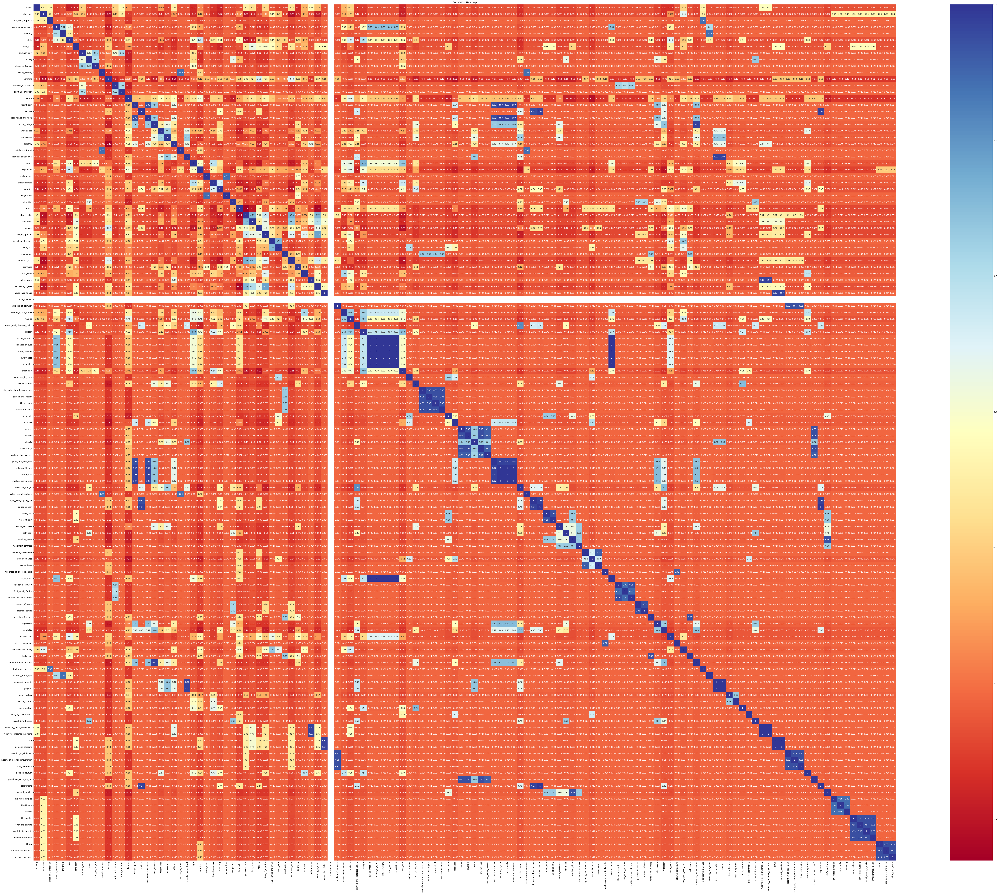

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# Compute correlation matrix
corr_matrix = df.corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(100, 80))
sns.heatmap(corr_matrix, annot=True, cmap='RdYlBu')
plt.title('Correlation Heatmap')
plt.show()

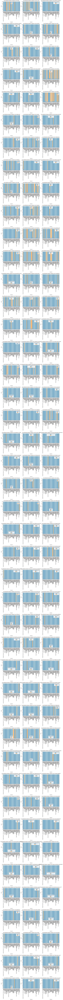

In [9]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have a DataFrame named 'df'

# Get the number of columns (excluding 'prognosis')
num_columns = len(df.columns) - 1

# Calculate the number of rows and columns for the subplots grid
num_rows = int((num_columns + 2) / 3)  # Adjust the number of rows as needed
num_cols = 3  # Set the number of columns per row

# Calculate the figure size based on the number of rows and columns
fig_width = 16
fig_height = 6 * num_rows

# Create the subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(fig_width, fig_height))

# Flatten the axes array
axes = axes.flatten()

# Iterate over the columns (excluding 'prognosis') and create the bar plots
for i, column in enumerate(df.columns):
    if column != 'prognosis':
        cross_tab = pd.crosstab(df['prognosis'], df[column])
        ax = axes[i]

        cross_tab.plot(kind='bar', stacked=True, ax=ax)
        ax.set_title(f"Cross-Tabulation between 'prognosis' and '{column}'")
        ax.set_xlabel('Prognosis')
        ax.set_ylabel('Count')

# Hide the extra subplots if there are more axes than columns
if len(axes) > num_columns:
    for ax in axes[num_columns:]:
        ax.axis('off')

# Adjust the spacing between subplots
plt.tight_layout(pad=1.5)

# Display the plot
plt.show()


In [10]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
df["prognosis"] = le.fit_transform(df["prognosis"])

In [12]:
X = df.drop('prognosis', axis=1)  # Assuming 'Disease' is the target variable
y = df['prognosis']

In [58]:
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

In [85]:
def relief(X, y, k=5, num_features=30):
    n_samples, n_features = X.shape
    feature_scores = np.zeros(n_features)
    for i in range(n_samples):
        distances = np.sum(np.square(X[i, :] - X), axis=1)
        nn_indices = np.argsort(distances)[1:k+1]
        for j in range(n_features):
            feature_scores[j] -= np.square(X[i, j] - X[nn_indices, j]).sum() / k
            if y[i] != y[nn_indices[0]]:
                feature_scores[j] += 2 * np.abs(X[i, j] - X[nn_indices[0], j]) / k
            if y[i] == y[nn_indices[0]]:
                feature_scores[j] -= 2 * np.abs(X[i, j] - X[nn_indices[0], j]) / k
    top_features = np.argsort(feature_scores)[:num_features]
    return feature_scores, top_features

In [87]:
X=X.to_numpy(dtype=int)
y=y.to_numpy(dtype=int)

In [88]:
feature_scores, top_features = relief(X, y,k=5,num_features=50)

print("Top features:", df.columns[top_features])

Top features: Index(['itching', 'irritability', 'depression', 'toxic_look_(typhos)',
       'internal_itching', 'passage_of_gases', 'continuous_feel_of_urine',
       'foul_smell_of urine', 'bladder_discomfort', 'loss_of_smell',
       'weakness_of_one_body_side', 'unsteadiness', 'loss_of_balance',
       'spinning_movements', 'movement_stiffness', 'swelling_joints',
       'stiff_neck', 'muscle_weakness', 'hip_joint_pain', 'knee_pain',
       'slurred_speech', 'drying_and_tingling_lips', 'extra_marital_contacts',
       'excessive_hunger', 'swollen_extremeties', 'brittle_nails',
       'enlarged_thyroid', 'puffy_face_and_eyes', 'swollen_blood_vessels',
       'swollen_legs', 'muscle_pain', 'obesity', 'altered_sensorium',
       'belly_pain', 'blister', 'inflammatory_nails', 'small_dents_in_nails',
       'silver_like_dusting', 'skin_peeling', 'scurring', 'blackheads',
       'pus_filled_pimples', 'painful_walking', 'palpitations',
       'prominent_veins_on_calf', 'blood_in_sputum', '

In [93]:

df_rilief_50=df.loc[:,['itching', 'irritability', 'depression', 'toxic_look_(typhos)',
       'internal_itching', 'passage_of_gases', 'continuous_feel_of_urine',
       'foul_smell_of urine', 'bladder_discomfort', 'loss_of_smell',
       'weakness_of_one_body_side', 'unsteadiness', 'loss_of_balance',
       'spinning_movements', 'movement_stiffness', 'swelling_joints',
       'stiff_neck', 'muscle_weakness', 'hip_joint_pain', 'knee_pain',
       'slurred_speech', 'drying_and_tingling_lips', 'extra_marital_contacts',
       'excessive_hunger', 'swollen_extremeties', 'brittle_nails',
       'enlarged_thyroid', 'puffy_face_and_eyes', 'swollen_blood_vessels',
       'swollen_legs', 'muscle_pain', 'obesity', 'altered_sensorium',
       'belly_pain', 'blister', 'inflammatory_nails', 'small_dents_in_nails',
       'silver_like_dusting', 'skin_peeling', 'scurring', 'blackheads',
       'pus_filled_pimples', 'painful_walking', 'palpitations',
       'prominent_veins_on_calf', 'blood_in_sputum', 'fluid_overload.1',
       'history_of_alcohol_consumption', 'distention_of_abdomen',
       'stomach_bleeding']]

In [106]:
feature_scores1, top_features1 = relief(X, y,k=5,num_features=60)

print("Top features:", df.columns[top_features1])

Top features: Index(['itching', 'irritability', 'depression', 'toxic_look_(typhos)',
       'internal_itching', 'passage_of_gases', 'continuous_feel_of_urine',
       'foul_smell_of urine', 'bladder_discomfort', 'loss_of_smell',
       'weakness_of_one_body_side', 'unsteadiness', 'loss_of_balance',
       'spinning_movements', 'movement_stiffness', 'swelling_joints',
       'stiff_neck', 'muscle_weakness', 'hip_joint_pain', 'knee_pain',
       'slurred_speech', 'drying_and_tingling_lips', 'extra_marital_contacts',
       'excessive_hunger', 'swollen_extremeties', 'brittle_nails',
       'enlarged_thyroid', 'puffy_face_and_eyes', 'swollen_blood_vessels',
       'swollen_legs', 'muscle_pain', 'obesity', 'altered_sensorium',
       'belly_pain', 'blister', 'inflammatory_nails', 'small_dents_in_nails',
       'silver_like_dusting', 'skin_peeling', 'scurring', 'blackheads',
       'pus_filled_pimples', 'painful_walking', 'palpitations',
       'prominent_veins_on_calf', 'blood_in_sputum', '

In [107]:
df_rilief_60=df.loc[:,['itching', 'irritability', 'depression', 'toxic_look_(typhos)',
       'internal_itching', 'passage_of_gases', 'continuous_feel_of_urine',
       'foul_smell_of urine', 'bladder_discomfort', 'loss_of_smell',
       'weakness_of_one_body_side', 'unsteadiness', 'loss_of_balance',
       'spinning_movements', 'movement_stiffness', 'swelling_joints',
       'stiff_neck', 'muscle_weakness', 'hip_joint_pain', 'knee_pain',
       'slurred_speech', 'drying_and_tingling_lips', 'extra_marital_contacts',
       'excessive_hunger', 'swollen_extremeties', 'brittle_nails',
       'enlarged_thyroid', 'puffy_face_and_eyes', 'swollen_blood_vessels',
       'swollen_legs', 'muscle_pain', 'obesity', 'altered_sensorium',
       'belly_pain', 'blister', 'inflammatory_nails', 'small_dents_in_nails',
       'silver_like_dusting', 'skin_peeling', 'scurring', 'blackheads',
       'pus_filled_pimples', 'painful_walking', 'palpitations',
       'prominent_veins_on_calf', 'blood_in_sputum', 'fluid_overload.1',
       'history_of_alcohol_consumption', 'distention_of_abdomen',
       'stomach_bleeding', 'coma', 'receiving_unsterile_injections',
       'receiving_blood_transfusion', 'visual_disturbances',
       'lack_of_concentration', 'rusty_sputum', 'mucoid_sputum',
       'family_history', 'polyuria', 'increased_appetite']]

In [109]:
feature_scores2, top_features2 = relief(X, y,k=5,num_features=70)

print("Top features:", df.columns[top_features2])


Top features: Index(['itching', 'irritability', 'depression', 'toxic_look_(typhos)',
       'internal_itching', 'passage_of_gases', 'continuous_feel_of_urine',
       'foul_smell_of urine', 'bladder_discomfort', 'loss_of_smell',
       'weakness_of_one_body_side', 'unsteadiness', 'loss_of_balance',
       'spinning_movements', 'movement_stiffness', 'swelling_joints',
       'stiff_neck', 'muscle_weakness', 'hip_joint_pain', 'knee_pain',
       'slurred_speech', 'drying_and_tingling_lips', 'extra_marital_contacts',
       'excessive_hunger', 'swollen_extremeties', 'brittle_nails',
       'enlarged_thyroid', 'puffy_face_and_eyes', 'swollen_blood_vessels',
       'swollen_legs', 'muscle_pain', 'obesity', 'altered_sensorium',
       'belly_pain', 'blister', 'inflammatory_nails', 'small_dents_in_nails',
       'silver_like_dusting', 'skin_peeling', 'scurring', 'blackheads',
       'pus_filled_pimples', 'painful_walking', 'palpitations',
       'prominent_veins_on_calf', 'blood_in_sputum', '

In [110]:
df_rilief_70=df.loc[:,['itching', 'irritability', 'depression', 'toxic_look_(typhos)',
       'internal_itching', 'passage_of_gases', 'continuous_feel_of_urine',
       'foul_smell_of urine', 'bladder_discomfort', 'loss_of_smell',
       'weakness_of_one_body_side', 'unsteadiness', 'loss_of_balance',
       'spinning_movements', 'movement_stiffness', 'swelling_joints',
       'stiff_neck', 'muscle_weakness', 'hip_joint_pain', 'knee_pain',
       'slurred_speech', 'drying_and_tingling_lips', 'extra_marital_contacts',
       'excessive_hunger', 'swollen_extremeties', 'brittle_nails',
       'enlarged_thyroid', 'puffy_face_and_eyes', 'swollen_blood_vessels',
       'swollen_legs', 'muscle_pain', 'obesity', 'altered_sensorium',
       'belly_pain', 'blister', 'inflammatory_nails', 'small_dents_in_nails',
       'silver_like_dusting', 'skin_peeling', 'scurring', 'blackheads',
       'pus_filled_pimples', 'painful_walking', 'palpitations',
       'prominent_veins_on_calf', 'blood_in_sputum', 'fluid_overload.1',
       'history_of_alcohol_consumption', 'distention_of_abdomen',
       'stomach_bleeding', 'coma', 'receiving_unsterile_injections',
       'receiving_blood_transfusion', 'visual_disturbances',
       'lack_of_concentration', 'rusty_sputum', 'mucoid_sputum',
       'family_history', 'polyuria', 'increased_appetite',
       'watering_from_eyes', 'dischromic _patches', 'abnormal_menstruation',
       'red_spots_over_body', 'bruising', 'cramps', 'dizziness', 'dehydration',
       'sweating', 'breathlessness']]

In [112]:
feature_scores3, top_features3 = relief(X, y,k=5,num_features=80)

print("Top features:", df.columns[top_features3])

Top features: Index(['itching', 'irritability', 'depression', 'toxic_look_(typhos)',
       'internal_itching', 'passage_of_gases', 'continuous_feel_of_urine',
       'foul_smell_of urine', 'bladder_discomfort', 'loss_of_smell',
       'weakness_of_one_body_side', 'unsteadiness', 'loss_of_balance',
       'spinning_movements', 'movement_stiffness', 'swelling_joints',
       'stiff_neck', 'muscle_weakness', 'hip_joint_pain', 'knee_pain',
       'slurred_speech', 'drying_and_tingling_lips', 'extra_marital_contacts',
       'excessive_hunger', 'swollen_extremeties', 'brittle_nails',
       'enlarged_thyroid', 'puffy_face_and_eyes', 'swollen_blood_vessels',
       'swollen_legs', 'muscle_pain', 'obesity', 'altered_sensorium',
       'belly_pain', 'blister', 'inflammatory_nails', 'small_dents_in_nails',
       'silver_like_dusting', 'skin_peeling', 'scurring', 'blackheads',
       'pus_filled_pimples', 'painful_walking', 'palpitations',
       'prominent_veins_on_calf', 'blood_in_sputum', '

In [113]:
df_rilief_80=df.loc[:,['itching', 'irritability', 'depression', 'toxic_look_(typhos)',
       'internal_itching', 'passage_of_gases', 'continuous_feel_of_urine',
       'foul_smell_of urine', 'bladder_discomfort', 'loss_of_smell',
       'weakness_of_one_body_side', 'unsteadiness', 'loss_of_balance',
       'spinning_movements', 'movement_stiffness', 'swelling_joints',
       'stiff_neck', 'muscle_weakness', 'hip_joint_pain', 'knee_pain',
       'slurred_speech', 'drying_and_tingling_lips', 'extra_marital_contacts',
       'excessive_hunger', 'swollen_extremeties', 'brittle_nails',
       'enlarged_thyroid', 'puffy_face_and_eyes', 'swollen_blood_vessels',
       'swollen_legs', 'muscle_pain', 'obesity', 'altered_sensorium',
       'belly_pain', 'blister', 'inflammatory_nails', 'small_dents_in_nails',
       'silver_like_dusting', 'skin_peeling', 'scurring', 'blackheads',
       'pus_filled_pimples', 'painful_walking', 'palpitations',
       'prominent_veins_on_calf', 'blood_in_sputum', 'fluid_overload.1',
       'history_of_alcohol_consumption', 'distention_of_abdomen',
       'stomach_bleeding', 'coma', 'receiving_unsterile_injections',
       'receiving_blood_transfusion', 'visual_disturbances',
       'lack_of_concentration', 'rusty_sputum', 'mucoid_sputum',
       'family_history', 'polyuria', 'increased_appetite',
       'watering_from_eyes', 'dischromic _patches', 'abnormal_menstruation',
       'red_spots_over_body', 'bruising', 'cramps', 'dizziness', 'dehydration',
       'sweating', 'breathlessness', 'sunken_eyes', 'high_fever', 'cough',
       'irregular_sugar_level', 'patches_in_throat', 'lethargy',
       'restlessness', 'weight_loss', 'mood_swings', 'cold_hands_and_feets']]

In [115]:

feature_scores4, top_features4 = relief(X, y,k=5,num_features=90)
print("Top features:", df.columns[top_features4])

Top features: Index(['itching', 'irritability', 'depression', 'toxic_look_(typhos)',
       'internal_itching', 'passage_of_gases', 'continuous_feel_of_urine',
       'foul_smell_of urine', 'bladder_discomfort', 'loss_of_smell',
       'weakness_of_one_body_side', 'unsteadiness', 'loss_of_balance',
       'spinning_movements', 'movement_stiffness', 'swelling_joints',
       'stiff_neck', 'muscle_weakness', 'hip_joint_pain', 'knee_pain',
       'slurred_speech', 'drying_and_tingling_lips', 'extra_marital_contacts',
       'excessive_hunger', 'swollen_extremeties', 'brittle_nails',
       'enlarged_thyroid', 'puffy_face_and_eyes', 'swollen_blood_vessels',
       'swollen_legs', 'muscle_pain', 'obesity', 'altered_sensorium',
       'belly_pain', 'blister', 'inflammatory_nails', 'small_dents_in_nails',
       'silver_like_dusting', 'skin_peeling', 'scurring', 'blackheads',
       'pus_filled_pimples', 'painful_walking', 'palpitations',
       'prominent_veins_on_calf', 'blood_in_sputum', '

In [116]:
df_rilief_90=df.loc[:,['itching', 'irritability', 'depression', 'toxic_look_(typhos)',
       'internal_itching', 'passage_of_gases', 'continuous_feel_of_urine',
       'foul_smell_of urine', 'bladder_discomfort', 'loss_of_smell',
       'weakness_of_one_body_side', 'unsteadiness', 'loss_of_balance',
       'spinning_movements', 'movement_stiffness', 'swelling_joints',
       'stiff_neck', 'muscle_weakness', 'hip_joint_pain', 'knee_pain',
       'slurred_speech', 'drying_and_tingling_lips', 'extra_marital_contacts',
       'excessive_hunger', 'swollen_extremeties', 'brittle_nails',
       'enlarged_thyroid', 'puffy_face_and_eyes', 'swollen_blood_vessels',
       'swollen_legs', 'muscle_pain', 'obesity', 'altered_sensorium',
       'belly_pain', 'blister', 'inflammatory_nails', 'small_dents_in_nails',
       'silver_like_dusting', 'skin_peeling', 'scurring', 'blackheads',
       'pus_filled_pimples', 'painful_walking', 'palpitations',
       'prominent_veins_on_calf', 'blood_in_sputum', 'fluid_overload.1',
       'history_of_alcohol_consumption', 'distention_of_abdomen',
       'stomach_bleeding', 'coma', 'receiving_unsterile_injections',
       'receiving_blood_transfusion', 'visual_disturbances',
       'lack_of_concentration', 'rusty_sputum', 'mucoid_sputum',
       'family_history', 'polyuria', 'increased_appetite',
       'watering_from_eyes', 'dischromic _patches', 'abnormal_menstruation',
       'red_spots_over_body', 'bruising', 'cramps', 'dizziness', 'dehydration',
       'sweating', 'breathlessness', 'sunken_eyes', 'high_fever', 'cough',
       'irregular_sugar_level', 'patches_in_throat', 'lethargy',
       'restlessness', 'weight_loss', 'mood_swings', 'cold_hands_and_feets',
       'anxiety', 'weight_gain', 'fatigue', 'spotting_ urination',
       'burning_micturition', 'vomiting', 'muscle_wasting', 'ulcers_on_tongue',
       'acidity', 'stomach_pain']]

In [118]:
X_train_50, X_test_50, y_train_50, y_test_50 = train_test_split(df_rilief_50, y, test_size=0.3, random_state=42)
X_train_60, X_test_60, y_train_60, y_test_60 = train_test_split(df_rilief_60, y, test_size=0.3, random_state=42)
X_train_70, X_test_70, y_train_70, y_test_70 = train_test_split(df_rilief_70, y, test_size=0.3, random_state=42)
X_train_80, X_test_80, y_train_80, y_test_80 = train_test_split(df_rilief_80, y, test_size=0.3, random_state=42)
X_train_90, X_test_90, y_train_90, y_test_90 = train_test_split(df_rilief_90, y, test_size=0.3, random_state=42)


SVM

In [121]:
print("SVM model with 50 features")
clf = svm.SVC(C = 1.0, kernel = 'sigmoid', gamma = 'auto')
clf.fit(X_train_50, y_train_50)
y_train_pred_50 = clf.predict(X_train_50)

# Predict on the testing data
y_test_pred_50 = clf.predict(X_test_50)

train_accuracy = accuracy_score(y_train_50, y_train_pred_50)
print("Training Accuracy:", train_accuracy)

# Calculate and print the testing accuracy
test_accuracy = accuracy_score(y_test_50, y_test_pred_50)
print("Testing Accuracy:", test_accuracy)

print()


print("SVM model with 60 features")
clf = svm.SVC(C = 1.0, kernel = 'sigmoid', gamma = 'auto')
clf.fit(X_train_60, y_train_60)
y_train_pred_60 = clf.predict(X_train_60)

# Predict on the testing data
y_test_pred_60 = clf.predict(X_test_60)

train_accuracy = accuracy_score(y_train_60, y_train_pred_60)
print("Training Accuracy:", train_accuracy)

# Calculate and print the testing accuracy
test_accuracy = accuracy_score(y_test_60, y_test_pred_60)
print("Testing Accuracy:", test_accuracy)


print()


print("SVM model with 70 features")
clf = svm.SVC(C = 1.0, kernel = 'sigmoid', gamma = 'auto')
clf.fit(X_train_70, y_train_70)
y_train_pred_70 = clf.predict(X_train_70)

# Predict on the testing data
y_test_pred_70 = clf.predict(X_test_70)

train_accuracy = accuracy_score(y_train_70, y_train_pred_70)
print("Training Accuracy:", train_accuracy)

# Calculate and print the testing accuracy
test_accuracy = accuracy_score(y_test_70, y_test_pred_70)
print("Testing Accuracy:", test_accuracy)

print()

print("SVM model with 80 features")
clf = svm.SVC(C = 1.0, kernel = 'sigmoid', gamma = 'auto')
clf.fit(X_train_80, y_train_80)
y_train_pred_80 = clf.predict(X_train_80)

# Predict on the testing data
y_test_pred_80 = clf.predict(X_test_80)

train_accuracy = accuracy_score(y_train_80, y_train_pred_80)
print("Training Accuracy:", train_accuracy)

# Calculate and print the testing accuracy
test_accuracy = accuracy_score(y_test_80, y_test_pred_80)
print("Testing Accuracy:", test_accuracy)


print()


print("SVM model with 90 features")
clf = svm.SVC(C = 1.0, kernel = 'sigmoid', gamma = 'auto')
clf.fit(X_train_90, y_train_90)
y_train_pred_90 = clf.predict(X_train_90)

# Predict on the testing data
y_test_pred_90 = clf.predict(X_test_90)

train_accuracy = accuracy_score(y_train_90, y_train_pred_90)
print("Training Accuracy:", train_accuracy)

# Calculate and print the testing accuracy
test_accuracy = accuracy_score(y_test_90, y_test_pred_90)
print("Testing Accuracy:", test_accuracy)

SVM model with 50 features
Training Accuracy: 0.6059814169570267
Testing Accuracy: 0.5738482384823849

SVM model with 60 features
Training Accuracy: 0.7186411149825784
Testing Accuracy: 0.7052845528455285

SVM model with 70 features
Training Accuracy: 0.8792102206736353
Testing Accuracy: 0.8672086720867209

SVM model with 80 features
Training Accuracy: 0.8835656213704994
Testing Accuracy: 0.8651761517615176

SVM model with 90 features
Training Accuracy: 0.9500580720092915
Testing Accuracy: 0.94579945799458


Random forest

In [123]:
print("Random Forest with 50 features")
clf = RandomForestClassifier(n_estimators = 200, max_depth = None, min_samples_split = 10)
clf.fit(X_train_50, y_train_50)
y_train_pred_50 = clf.predict(X_train_50)

# Predict on the testing data
y_test_pred_50 = clf.predict(X_test_50)

train_accuracy = accuracy_score(y_train_50, y_train_pred_50)
print("Training Accuracy:", train_accuracy)

# Calculate and print the testing accuracy
test_accuracy = accuracy_score(y_test_50, y_test_pred_50)
print("Testing Accuracy:", test_accuracy)

print()


print("Random Forest with 60 features")
clf = RandomForestClassifier(n_estimators = 200, max_depth = None, min_samples_split = 10)
clf.fit(X_train_60, y_train_60)
y_train_pred_60 = clf.predict(X_train_60)

# Predict on the testing data
y_test_pred_60 = clf.predict(X_test_60)

train_accuracy = accuracy_score(y_train_60, y_train_pred_60)
print("Training Accuracy:", train_accuracy)

# Calculate and print the testing accuracy
test_accuracy = accuracy_score(y_test_60, y_test_pred_60)
print("Testing Accuracy:", test_accuracy)

print()

print("Random Forest with 70 features")
clf = RandomForestClassifier(n_estimators = 200, max_depth = None, min_samples_split = 10)
clf.fit(X_train_70, y_train_70)
y_train_pred_70 = clf.predict(X_train_70)

# Predict on the testing data
y_test_pred_70 = clf.predict(X_test_70)

train_accuracy = accuracy_score(y_train_70, y_train_pred_70)
print("Training Accuracy:", train_accuracy)

# Calculate and print the testing accuracy
test_accuracy = accuracy_score(y_test_70, y_test_pred_70)
print("Testing Accuracy:", test_accuracy)

print()

print("Random Forest with 80 features")
clf = RandomForestClassifier(n_estimators = 200, max_depth = None, min_samples_split = 10)
clf.fit(X_train_80, y_train_80)
y_train_pred_80 = clf.predict(X_train_80)

# Predict on the testing data
y_test_pred_80 = clf.predict(X_test_80)

train_accuracy = accuracy_score(y_train_80, y_train_pred_80)
print("Training Accuracy:", train_accuracy)

# Calculate and print the testing accuracy
test_accuracy = accuracy_score(y_test_80, y_test_pred_80)
print("Testing Accuracy:", test_accuracy)

print()

print("Random Forest with 90 features")
clf = RandomForestClassifier(n_estimators = 200, max_depth = None, min_samples_split = 10)
clf.fit(X_train_90, y_train_90)
y_train_pred_90 = clf.predict(X_train_90)

# Predict on the testing data
y_test_pred_90 = clf.predict(X_test_90)

train_accuracy = accuracy_score(y_train_90, y_train_pred_90)
print("Training Accuracy:", train_accuracy)

# Calculate and print the testing accuracy
test_accuracy = accuracy_score(y_test_90, y_test_pred_90)
print("Testing Accuracy:", test_accuracy)

Random Forest with 50 features
Training Accuracy: 0.6129500580720093
Testing Accuracy: 0.5819783197831978

Random Forest with 60 features
Training Accuracy: 0.7250290360046457
Testing Accuracy: 0.714769647696477

Random Forest with 70 features
Training Accuracy: 0.8873403019744484
Testing Accuracy: 0.8766937669376694

Random Forest with 80 features
Training Accuracy: 0.9425087108013938
Testing Accuracy: 0.9349593495934959

Random Forest with 90 features
Training Accuracy: 0.9927409988385598
Testing Accuracy: 0.9925474254742548


In [125]:
print("Logistic Regression for 50 features")
model = LogisticRegression(C=1.0, penalty='l2', solver='liblinear')

# Fit the model on the training data
model.fit(X_train_50, y_train_50)

# Predict on the training data
y_train_pred_50 = model.predict(X_train_50)

# Predict on the testing data
y_test_pred_50 = model.predict(X_test_50)

# Calculate and print the training accuracy
train_accuracy = accuracy_score(y_train_50, y_train_pred_50)
print("Training Accuracy:", train_accuracy)

# Calculate and print the testing accuracy
test_accuracy = accuracy_score(y_test_50, y_test_pred_50)
print("Testing Accuracy:", test_accuracy)

print()


print("Logistic Regression for 60 features")
model = LogisticRegression(C=1.0, penalty='l2', solver='liblinear')

# Fit the model on the training data
model.fit(X_train_60, y_train_60)

# Predict on the training data
y_train_pred_60 = model.predict(X_train_60)

# Predict on the testing data
y_test_pred_60 = model.predict(X_test_60)

# Calculate and print the training accuracy
train_accuracy = accuracy_score(y_train_60, y_train_pred_60)
print("Training Accuracy:", train_accuracy)

# Calculate and print the testing accuracy
test_accuracy = accuracy_score(y_test_60, y_test_pred_60)
print("Testing Accuracy:", test_accuracy)

print()

print("Logistic Regression for 70 features")
model = LogisticRegression(C=1.0, penalty='l2', solver='liblinear')

# Fit the model on the training data
model.fit(X_train_70, y_train_70)

# Predict on the training data
y_train_pred_70 = model.predict(X_train_70)

# Predict on the testing data
y_test_pred_70 = model.predict(X_test_70)

# Calculate and print the training accuracy
train_accuracy = accuracy_score(y_train_70, y_train_pred_70)
print("Training Accuracy:", train_accuracy)

# Calculate and print the testing accuracy
test_accuracy = accuracy_score(y_test_70, y_test_pred_70)
print("Testing Accuracy:", test_accuracy)


print()

print("Logistic Regression for 80 features")
model = LogisticRegression(C=1.0, penalty='l2', solver='liblinear')

# Fit the model on the training data
model.fit(X_train_80, y_train_80)

# Predict on the training data
y_train_pred_80 = model.predict(X_train_80)

# Predict on the testing data
y_test_pred_80 = model.predict(X_test_80)

# Calculate and print the training accuracy
train_accuracy = accuracy_score(y_train_80, y_train_pred_80)
print("Training Accuracy:", train_accuracy)

# Calculate and print the testing accuracy
test_accuracy = accuracy_score(y_test_80, y_test_pred_80)
print("Testing Accuracy:", test_accuracy)


print()


print("Logistic Regression for 90 features")
model = LogisticRegression(C=1.0, penalty='l2', solver='liblinear')

# Fit the model on the training data
model.fit(X_train_90, y_train_90)

# Predict on the training data
y_train_pred_90 = model.predict(X_train_90)

# Predict on the testing data
y_test_pred_90 = model.predict(X_test_90)

# Calculate and print the training accuracy
train_accuracy = accuracy_score(y_train_90, y_train_pred_90)
print("Training Accuracy:", train_accuracy)

# Calculate and print the testing accuracy
test_accuracy = accuracy_score(y_test_90, y_test_pred_90)
print("Testing Accuracy:", test_accuracy)

Logistic Regression for 50 features
Training Accuracy: 0.6129500580720093
Testing Accuracy: 0.5819783197831978

Logistic Regression for 60 features
Training Accuracy: 0.7250290360046457
Testing Accuracy: 0.714769647696477

Logistic Regression for 70 features
Training Accuracy: 0.8847270615563299
Testing Accuracy: 0.8746612466124661

Logistic Regression for 80 features
Training Accuracy: 0.9425087108013938
Testing Accuracy: 0.9349593495934959

Logistic Regression for 90 features
Training Accuracy: 0.9915795586527294
Testing Accuracy: 0.9911924119241192


In [129]:
print("Decision Tree model with 50 features")
model = DecisionTreeClassifier()

# Fit the model on the training data
model.fit(X_train_50, y_train_50)

# Predict on the training data
y_train_pred_50 = model.predict(X_train_50)

# Predict on the testing data
y_test_pred_50 = model.predict(X_test_50)

# Calculate and print the training accuracy
train_accuracy = accuracy_score(y_train_50, y_train_pred_50)
print("Training Accuracy:", train_accuracy)

# Calculate and print the testing accuracy
test_accuracy = accuracy_score(y_test_50, y_test_pred_50)
print("Testing Accuracy:", test_accuracy)

print()

print("Decision Tree model with 60 features")
model = DecisionTreeClassifier()

# Fit the model on the training data
model.fit(X_train_60, y_train_60)

# Predict on the training data
y_train_pred_60 = model.predict(X_train_60)

# Predict on the testing data
y_test_pred_60 = model.predict(X_test_60)

# Calculate and print the training accuracy
train_accuracy = accuracy_score(y_train_60, y_train_pred_60)
print("Training Accuracy:", train_accuracy)

# Calculate and print the testing accuracy
test_accuracy = accuracy_score(y_test_60, y_test_pred_60)
print("Testing Accuracy:", test_accuracy)

print()


print("Decision Tree model with 70 features")
model = DecisionTreeClassifier()

# Fit the model on the training data
model.fit(X_train_70, y_train_70)

# Predict on the training data
y_train_pred_70 = model.predict(X_train_70)

# Predict on the testing data
y_test_pred_70 = model.predict(X_test_70)

# Calculate and print the training accuracy
train_accuracy = accuracy_score(y_train_70, y_train_pred_70)
print("Training Accuracy:", train_accuracy)

# Calculate and print the testing accuracy
test_accuracy = accuracy_score(y_test_70, y_test_pred_70)
print("Testing Accuracy:", test_accuracy)


print()


print("Decision Tree model with 80 features")
model = DecisionTreeClassifier()

# Fit the model on the training data
model.fit(X_train_80, y_train_80)

# Predict on the training data
y_train_pred_80 = model.predict(X_train_80)

# Predict on the testing data
y_test_pred_80 = model.predict(X_test_80)

# Calculate and print the training accuracy
train_accuracy = accuracy_score(y_train_80, y_train_pred_80)
print("Training Accuracy:", train_accuracy)

# Calculate and print the testing accuracy
test_accuracy = accuracy_score(y_test_80, y_test_pred_80)
print("Testing Accuracy:", test_accuracy)

print()


print("Decision Tree model with 90 features")
model = DecisionTreeClassifier()

# Fit the model on the training data
model.fit(X_train_90, y_train_90)

# Predict on the training data
y_train_pred_90 = model.predict(X_train_90)

# Predict on the testing data
y_test_pred_90 = model.predict(X_test_90)

# Calculate and print the training accuracy
train_accuracy = accuracy_score(y_train_90, y_train_pred_90)
print("Training Accuracy:", train_accuracy)

# Calculate and print the testing accuracy
test_accuracy = accuracy_score(y_test_90, y_test_pred_90)
print("Testing Accuracy:", test_accuracy)

Decision Tree model with 50 features
Training Accuracy: 0.6129500580720093
Testing Accuracy: 0.5819783197831978

Decision Tree model with 60 features
Training Accuracy: 0.7250290360046457
Testing Accuracy: 0.714769647696477

Decision Tree model with 70 features
Training Accuracy: 0.8873403019744484
Testing Accuracy: 0.8766937669376694

Decision Tree model with 80 features
Training Accuracy: 0.9425087108013938
Testing Accuracy: 0.9349593495934959

Decision Tree model with 90 features
Training Accuracy: 0.9927409988385598
Testing Accuracy: 0.9925474254742548


Choosing Random Forest classfier with 90 features

In [131]:
model = RandomForestClassifier(n_estimators = 200, max_depth = None, min_samples_split = 10)
model.fit(X_train_90, y_train_90)
y_train_pred_90 = clf.predict(X_train_90)

# Predict on the testing data
y_test_pred_90 = clf.predict(X_test_90)

train_accuracy = accuracy_score(y_train_90, y_train_pred_90)
print("Training Accuracy:", train_accuracy)

# Calculate and print the testing accuracy
test_accuracy = accuracy_score(y_test_90, y_test_pred_90)
print("Testing Accuracy:", test_accuracy)

Training Accuracy: 0.9927409988385598
Testing Accuracy: 0.9925474254742548


In [132]:
import pickle
pickle.dump(model, open('model.pkl', 'wb'))

In [134]:
pickled_model = pickle.load(open('model.pkl', 'rb'))
pickled_model.predict(X_test_90)

array([ 2,  2, 24, ..., 30, 26, 11])